In [ ]:
from google.colab import drive

drive.mount('/content/drive')

In [3]:
data_path = '/content/drive/My Drive/data_folder'

In [4]:
import torch
from torchvision import transforms, datasets
import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils

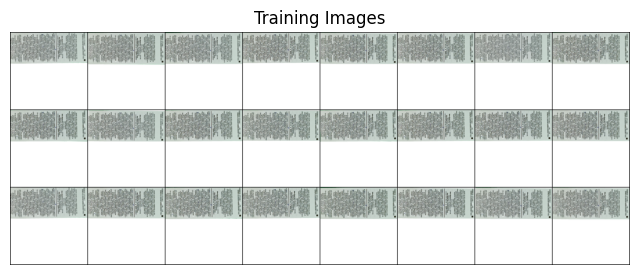

In [5]:
# Covert image to 64 * 64
image_size = 256

# Number of workers for dataloader
workers = 2

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Batch size during training
batch_size = 24

data_transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
    (0.5, 0.5, 0.5)),
])


dataset = datasets.ImageFolder(data_path, transform=data_transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True,
                                         num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0)
        else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64],
                                         padding=2,
                                         normalize=True).cpu(),(1,2,0)))
plt.show()

In [6]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML


random.seed(42)
torch.manual_seed(42)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

In [7]:
## Some more hyperparameters for the training

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 256

# Size of feature maps in discriminator
ndf = 256

# Number of training epochs
num_epochs = 20

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers specified in architecture of CTGAN
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1


In [10]:
# We need to initialize weights for both conv layers and normalisation layers
# using normal from a Normal distribution with mean=0, stdev=0.02.
# The weights_init function takes an initialized model as input and
# reinitializes all convolutional, convolutional-transpose, and batch
# normalization layers to meet this criteria.
# This function is applied to the models immediately after initialization.

def initialize_weights(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm') != -1:
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0)

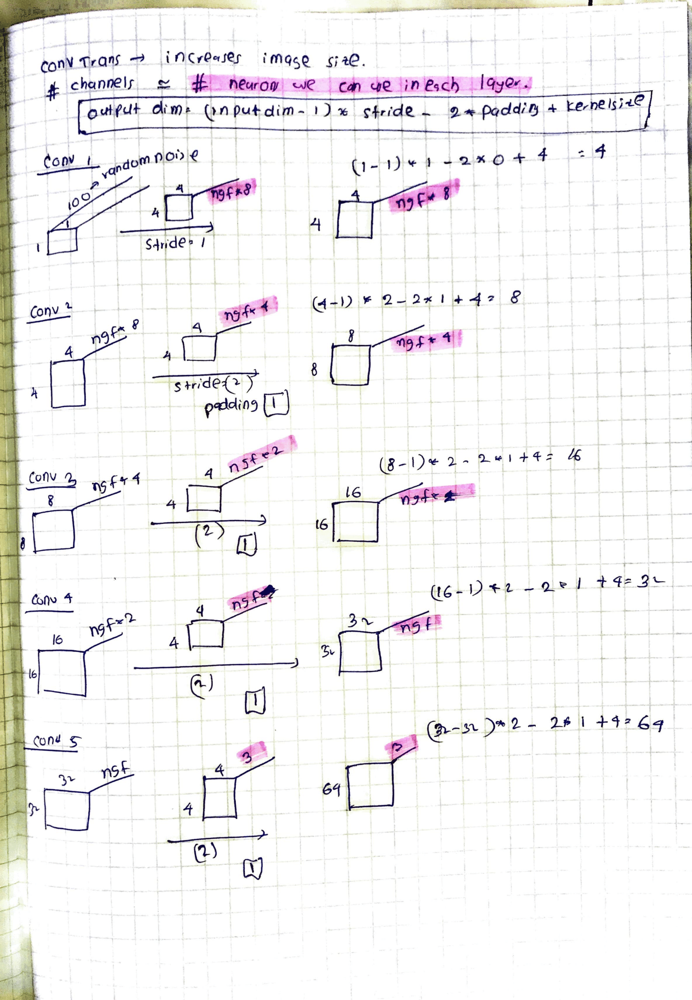

In [11]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(

            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 32, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 32),
            nn.ReLU(True),
            # state size. (ngf*32) x 4 x 4

            nn.ConvTranspose2d(ngf * 32, ngf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            # state size. (ngf*16) x 8 x 8

            nn.ConvTranspose2d( ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 16 x 16

            nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),
            # state size. (ngf*4) x 32 x 32

            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            # state size. (ngf*2) x 64 x 64

            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 128 x 128

            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 256 x 256
            # Tanh used to limit the results between [-1,1] in the image
        )

    def forward(self, input):
        return self.main(input)

In [12]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == "cuda") and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the "weights_init" function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(initialize_weights)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 8192, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(8192, 4096, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(4096, 2048, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(2048, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1

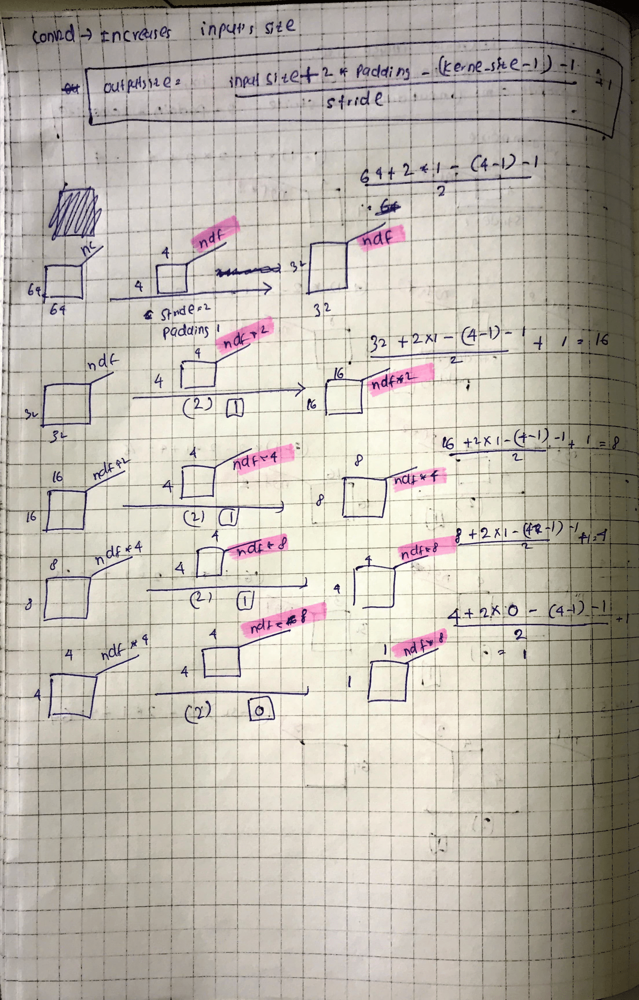

In [13]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 256 x 256
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 128 x 128

            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 64 x 64

            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 32 x 32

            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 16 x 16

            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*16) x 8 x 8

            nn.Conv2d(ndf * 16, ndf * 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 32),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*32) x 4 x 4

            nn.Conv2d(ndf * 32, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # state size. (ndf*32) x 1 x 1
            # The sigmoid function squashes the output and provide a probability
            #value
        )

    def forward(self, input):
        return self.main(input)


In [14]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
# like this: to mean=0, stdev=0.2.
netD.apply(initialize_weights)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(1024, 2048, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(2048, 4096, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(4096, e

We are going to use cross-entropy loss for binary cases to as the
classification loss function, The objective is to minimize loss depending on What phase of training we are on.

Adam optimizer
---------------

This is an optimizer to update weights and biases through backpropagation. It has two hyperparameters: Beta1 and Beta2. Beta1 controls the the contribution from the mean of gradients and beta2 controls the contribution from variance of the gradients. Beta 1 is unique to CTGAN architecture. Beta 2 is usually set to be around 1. We set the learning rate to a small value.

In [15]:

#Initialize the BCELoss function
criterion = nn.BCELoss()

# Create batch of(64) random noise(latent) vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

The closer the label is to being real , the resut will be closer to 1. (real_label=1).

**The generators objective => Maximize log(D(G(z))) **
(When z is random noise sent through the Generator, Discriminator saying it is a real image i.e . discriminator result being close to 1 is what the Generator wants. )

**The discriminator objective => Maximize(log(D(x))+log(1−D(G(z))))**
(When the image  from the real dataset x goes through the discriminator, the result should be as close as possible to 1 and when the result of a random noise that has gone through the generator goes through the discriminator, the result should be as low as possible.)

Discriminator training
------------------------

pat 1( log(D(x))) : Send a set of real datapoints x to foward pass through discriminator and calculate loss. Then use that loss to backward pass and and calculate gradients.

part 2(log(1−D(G(z))))) : Generate a  set of samples with current generator, forward pass them through discriminator, calculate loss and backwardpass the loss to calculate gradients.

Using gradients of step 1 and step 2 call a step of discriminator optimizer.


Generator training
--------------------

We use the images generated in step 2 above and compare them with actual images x (we consider these as the ground truth).Using this loss in the backward pass the gradient is calcuated and using these updated values, the generator optimizer takes a step.


In [ ]:
# Number of training epochs
num_epochs = 1

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):

    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch

        netD.zero_grad()

        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float,
                           device=device)

        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)

        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()




        ## Train with all-fake batch

        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)

        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)

        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)

        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)

        # Calculate the gradients for this batch, accumulated (summed)
        # with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake

        # Update D
        optimizerD.step()





        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################

        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost

        # Since we just updated D, perform another forward pass of
        # all-fake batch through D
        output = netD(fake).view(-1)

        # Calculate G's loss based on this output
        errG = criterion(output, label)

        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()

        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print("[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f"
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...


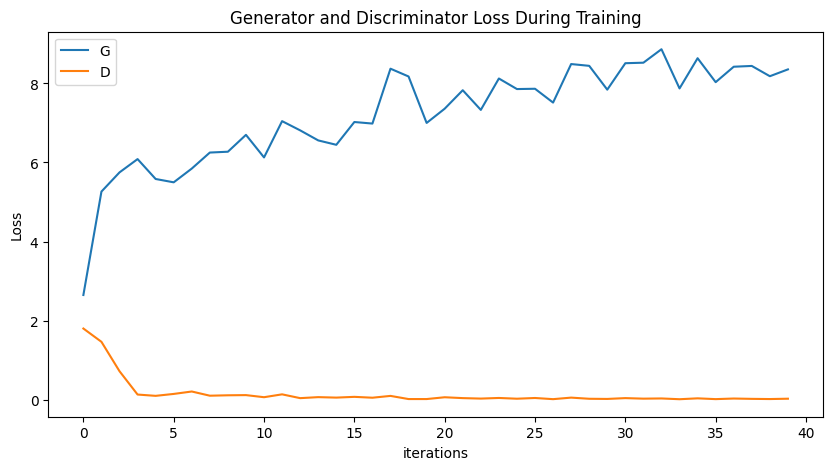

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

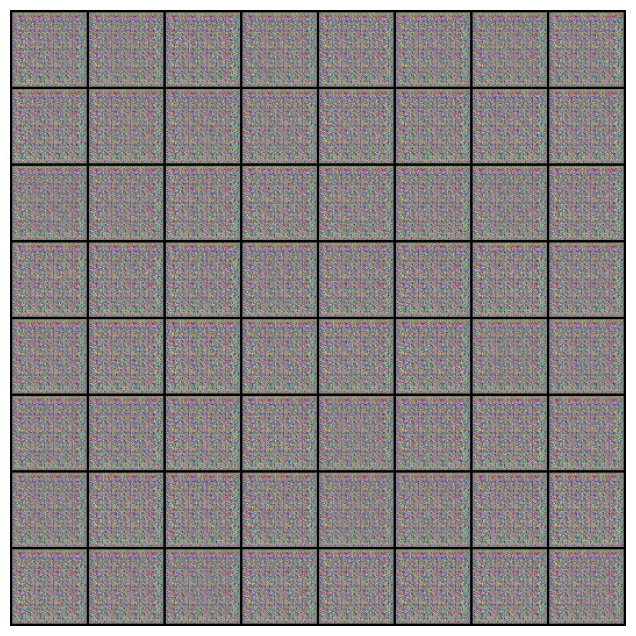

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

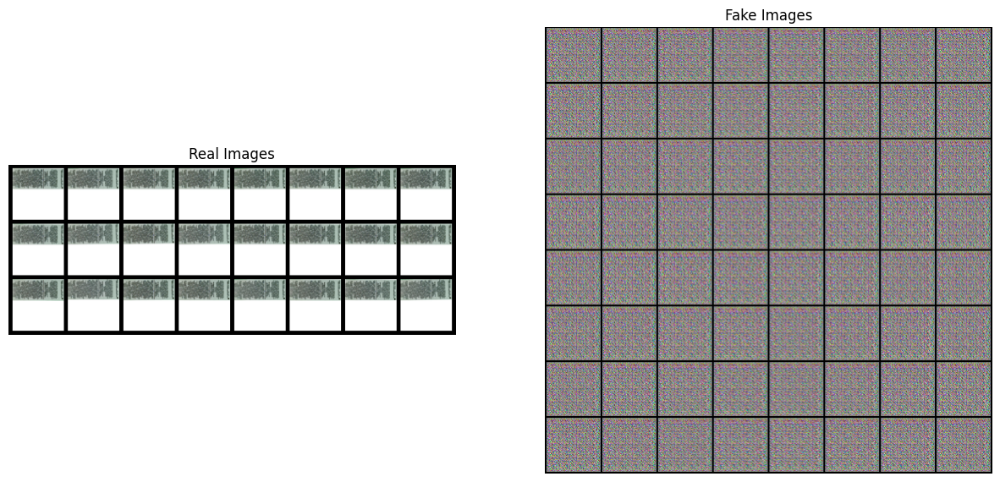

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

Given one good label generate multiple images
Material changes
Light conditions





Points I can improve on
-----------------------
1. Lower image complexity/ use actual data
2. Increase image size to the nearest square size of base of 2
3. Increase the number of epochs
4. Play with learning rate
**5. Findout if Sigmoid function is getting in the way**



Note on where to stop: https://stackoverflow.com/questions/49420459/what-is-the-ideal-value-of-loss-function-for-a-gan


I struggled with this for quite some time, and wondered why the question wasn't asked. What follows is where I'm currently at. Not sure if it'll help you, but it is some of my intuition.

G and D losses are good indicators of failure cases...
Of course, if G loss is a really big number and D is zero, then nothing good is happening in your GAN.

... but not good indicators of performance.
I've trained a bunch of GANs and have almost never seen the "0.5/0.5 case" except on very simple examples. Most of the time, you're happy when outputs D(x) and D(G(z)) (and therefore, the losses) are more or less stable. So don't take these values for "gold standard".
A key intuition I was missing was in simultaneousity of G and D training. At the beginning, sure G is really bad at generating stuff, but D is also really bad at discriminating them. As time passes, G gets better, but D also gets better. So after many epochs, we can think that D is really good at discriminating between fake and real. Therefore, even if G "fools" D only 5% of the time (i.e. D(x)=0.95 and D(G(z))=0.05) then it can mean that G is actually pretty good because it fools sometimes a really good discriminator.
As you know, there are not reliable metrics of image quality besides looking at it for the moment, but I've found that for my usecases, G could produce great images while fooling D only a few % of the time.
A corrolary to this simultaneous training is what's happening at the beginning of the training : You can have D(X)=0.5 and D(G(Z))=0.5, and still have G produce almost random images : it's just that D is not good enough yet to tell them apart from real images.

I see it's been a couple months since you've posted this question. If you've gained intuition in the meantime, I'd be happy to hear it !